In [1]:
import sys
sys.path.append('./utils')  # make sure Python knows where to look

# Display full output in Jupyter
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

import time
import datetime
import sklearn
from imblearn import under_sampling, over_sampling, ensemble
import lightgbm as lgb
from catboost import CatBoostClassifier 
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier

import transform_data_functions as utils_transform_data
import plot_data_functions as utils_plot_data
import ml_training_functions as utils_training
import import_shared_functions as utils_import
import file_handler_functions as utils_file
import performance_assessment_function as utils_assessment

In [2]:
# Load data from the 2018-07-25 to the 2018-08-14
DIR_INPUT='./data/simulated-data-transformed/' 

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-08-14"

print("Load  files")
%time transactions_df = utils_file.read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

Load  files
CPU times: user 89.1 ms, sys: 131 ms, total: 220 ms
Wall time: 359 ms
622892 transactions loaded, containing 5515 fraudulent transactions


#### Define Starting and Ending date for training and testing data records

In [3]:
START_DATE = "2018-07-25"
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

# Number of folds for the prequential validation
n_folds = 4

start_date_training = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

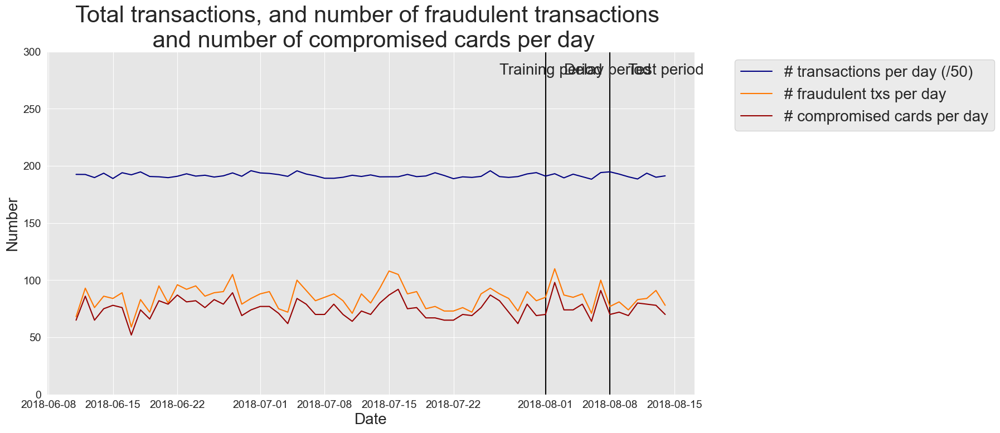

In [4]:
utils_plot_data.plot_nb_transaction_per_day(transactions_df, start_date_training, start_date_test, delta_train, delta_delay, delta_test)

In [5]:
train_df, test_df = utils_transform_data.get_train_test_set(transactions_df, start_date_training, delta_train, delta_delay ,delta_test)

In [6]:
# The trainig set contains 67240 transactions, among which 598 are fraudulent.
train_df.shape, train_df[train_df.TX_FRAUD==1].shape

((67240, 23), (598, 23))

In [7]:
#The test set contains 58264 transactions, among which 385 are fraudulent.
test_df.shape, test_df[test_df.TX_FRAUD==1].shape, f'Thus, the fraudulent transactions\'s proportion:  385/58264 = ~{(385/58264):.4f}'

((58264, 23),
 (385, 23),
 "Thus, the fraudulent transactions's proportion:  385/58264 = ~0.0066")

In [8]:
train_df.head()

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,TX_DURING_NIGHT,CUSTOMER_ID_NB_TX_1DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW,CUSTOMER_ID_NB_TX_7DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW,TERMINAL_ID_NB_TX_1DAY_WINDOW,TERMINAL_ID_RISK_1DAY_WINDOW,TERMINAL_ID_NB_TX_7DAY_WINDOW,TERMINAL_ID_RISK_7DAY_WINDOW,TERMINAL_ID_NB_TX_30DAY_WINDOW,TERMINAL_ID_RISK_30DAY_WINDOW
421597,1102483,2018-07-25 00:00:29,1111,2328,40.77,9936029,115,0,0,0,1,2.0,29.005000,24.0,29.191250,105.0,30.141810,1.0,0.0,10.0,0.0,32.0,0.0
421598,1102484,2018-07-25 00:01:08,676,6846,9.62,9936068,115,0,0,0,1,4.0,25.492500,15.0,19.151333,61.0,18.253607,2.0,0.0,5.0,0.0,27.0,0.0
421599,1102485,2018-07-25 00:01:35,402,4771,81.55,9936095,115,0,0,0,1,6.0,130.778333,11.0,183.875455,50.0,112.001800,0.0,0.0,12.0,0.0,37.0,0.0
421600,1102486,2018-07-25 00:01:43,4218,863,23.10,9936103,115,0,0,0,1,8.0,19.600000,24.0,21.201667,93.0,19.987849,2.0,0.0,6.0,0.0,22.0,0.0
421601,1102487,2018-07-25 00:02:26,3711,3599,59.25,9936146,115,0,0,0,1,5.0,84.656000,27.0,80.427407,110.0,74.158455,1.0,0.0,10.0,0.0,38.0,0.0


In [9]:
# Specified input features for model training and target features for predictions

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']


# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(utils_import.card_precision_top_k_custom, 
                                                     needs_proba=True, 
                                                     top_k=100, 
                                                     transactions_df=transactions_df_scorer)

def card_precision_scorer(estimator, X, y):
    # estimator must support predict_proba
    probs = estimator.predict_proba(X)[:, 1]
    # use the transactions metadata indexed by the current CV test fold rows
    preds_df = transactions_df_scorer.loc[X.index].copy()
    preds_df['predictions'] = probs
    # utils_training.card_precision_top_k returns (nb_list, list_per_day, mean)
    _, _, mean_cp = utils_training.card_precision_top_k(preds_df, 100)
    return mean_cp

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_scorer,
           }

In [10]:
model_performances = []
execution_times = []
 
prequential_split_indices=utils_training.prequentialSplit(transactions_df,
                                               start_date_training=start_date_training, 
                                               n_folds=n_folds, 
                                               delta_train=delta_train, 
                                               delta_delay=delta_delay, 
                                               delta_assessment=delta_assessment)

In [11]:
len(prequential_split_indices), len(prequential_split_indices[0]), len(prequential_split_indices[0][0]) 

(4, 2, 67240)

### Test Performance on Logistic Regression Model

In [12]:
def save_and_display_performance_report(classifier_name, param_name, performance_df, execution_time, model_performances, execution_times):
    parameters_dict=dict(performance_df['Parameters'])
    performance_df['Parameters summary']=[parameters_dict[i][param_name] for i in range(len(parameters_dict))]
    model_performances.append([classifier_name, param_name, performance_df])
    execution_times.append(execution_time)
    utils_file.save_model_performance_result_to_file(model_performances, execution_times)
    return utils_assessment.get_summary_performances(performance_df, parameter_column_name="Parameters summary")

In [ ]:
def filter_best_params(model_performance):
    best_param = {}
    for key, value in model_performance.items():
        if "clf__" in key:
            best_param[key] = value
    return best_param

In [13]:
# this handle imbalance dataset with 'class_weight' param
classifier = sklearn.linear_model.LogisticRegression() # -> based on param

# this handle imbalance dataset with hybrid-sampling technique
sampler_list = [('sampler1', over_sampling.SMOTE()),
                ('sampler2', under_sampling.RandomUnderSampler())]
parameters = {'clf__C':[0.1,1,10,100], 'clf__random_state':[0],
              'sampler1__sampling_strategy':[0.1], 
              'sampler2__sampling_strategy':[0.1, 0.5, 1], 
              'sampler1__random_state':[0], 'sampler2__random_state':[0]}

start_time = time.time()

logreg_performance_hybrid = utils_training.model_selection_wrapper_with_sample(
                                        transactions_df=transactions_df,
                                        classifier=classifier,
                                        sampler_list=sampler_list,
                                        input_features=input_features,
                                        output_feature=output_feature,
                                        parameters=parameters,
                                        scoring=scoring,
                                        cv=prequential_split_indices,
                                        start_date_training_for_valid=start_date_training_for_valid,
                                        start_date_training_for_test=start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_logreg_hybrid = time.time()-start_time

In [14]:
logreg_performance_hybrid.head(), execution_time_weighted_logreg_hybrid

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.869043          0.010433                0.567374   
 1      0.867647          0.012012                0.505570   
 2      0.866335          0.013375                0.461570   
 3      0.869680          0.010257                0.567636   
 4      0.869676          0.011315                0.525340   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.026079                 0.281429   
 1                    0.044574                 0.282500   
 2                    0.033232                 0.280357   
 3                    0.026953                 0.281071   
 4                    0.053866                 0.281429   
 
    Card Precision@100 Test Std  \
 0                     0.022177   
 1                     0.021005   
 2                     0.019545   
 3                     0.022574   
 4                     0.022565   
 
                                                          

In [15]:
# parameters_dict=dict(logreg_performance_hybrid['Parameters'])
# logreg_performance_hybrid['Parameters summary']=[parameters_dict[i]['sampler2__sampling_strategy'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__ + '_hybrid', 'sampler2__sampling_strategy', logreg_performance_hybrid])
# execution_times.append(execution_time_weighted_logreg_hybrid)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(logreg_performance_hybrid, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__ + '_hybrid', 
    'sampler2__sampling_strategy', 
    logreg_performance_hybrid, 
    execution_time_weighted_logreg_hybrid,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.5,0.1,0.5
Validation performance,0.87+/-0.01,0.568+/-0.03,0.283+/-0.02
Test performance,0.87+/-0.01,0.568+/-0.03,0.283+/-0.02
Optimal parameter(s),0.5,0.1,0.5
Optimal test performance,0.87+/-0.01,0.568+/-0.03,0.283+/-0.02
Best hyperparameters,"{'clf__C': 100, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.5}","{'clf__C': 100, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.1}","{'clf__C': 0.1, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.5}"
Optimal hyperparameters,"{'clf__C': 100, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.5}","{'clf__C': 100, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.1}","{'clf__C': 0.1, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.5}"


In [ ]:
best_params = filter_best_params(logreg_performance_hybrid)

In [ ]:
# this handle imbalance dataset with only oversampling technique
sampler_list = [('sampler', over_sampling.SMOTE())]
parameters = {'sampler__sampling_strategy':[0.1], 'sampler__random_state':[0]} | best_params

start_time = time.time()

logreg_performance_over = utils_training.model_selection_wrapper_with_sample(
                                        transactions_df=transactions_df, 
                                        classifier=classifier, 
                                        sampler_list=sampler_list,
                                        input_features=input_features, 
                                        output_feature=output_feature,
                                        parameters=parameters, 
                                        scoring=scoring, 
                                        cv=prequential_split_indices,
                                        start_date_training_for_valid=start_date_training_for_valid,
                                        start_date_training_for_test=start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_logreg_over = time.time()-start_time

In [17]:
logreg_performance_over, execution_time_weighted_logreg_over

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.869043          0.010433                0.567371   
 1      0.869682          0.010256                0.567641   
 2      0.869736          0.010232                0.567717   
 3      0.869744          0.010230                0.567722   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.026080                 0.281429   
 1                    0.026949                 0.281071   
 2                    0.027146                 0.281071   
 3                    0.027160                 0.281071   
 
    Card Precision@100 Test Std  \
 0                     0.022177   
 1                     0.022574   
 2                     0.022574   
 3                     0.022574   
 
                                                                                                Parameters  \
 0  {'clf__C': 0.1, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.

In [18]:
# parameters_dict=dict(logreg_performance_over['Parameters'])
# logreg_performance_over['Parameters summary']=[parameters_dict[i]['sampler__sampling_strategy'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__ + '_over', 'sampler__sampling_strategy', logreg_performance_over])
# execution_times.append(execution_time_weighted_logreg_over)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(logreg_performance_over, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__ + '_over', 
    'sampler__sampling_strategy', 
    logreg_performance_over, 
    execution_time_weighted_logreg_over,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.1,0.1,0.1
Validation performance,0.87+/-0.01,0.568+/-0.03,0.281+/-0.02
Test performance,0.87+/-0.01,0.568+/-0.03,0.281+/-0.02
Optimal parameter(s),0.1,0.1,0.1
Optimal test performance,0.87+/-0.01,0.568+/-0.03,0.281+/-0.02
Best hyperparameters,"{'clf__C': 100, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__C': 100, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__C': 0.1, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}"
Optimal hyperparameters,"{'clf__C': 100, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__C': 100, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__C': 0.1, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}"


In [ ]:
parameters = {'clf__class_weight':['balanced']} | best_params

start_time = time.time()

logreg_performance = utils_training.model_selection_wrapper(
                                        transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_logreg = time.time()-start_time


In [20]:
logreg_performance, execution_time_weighted_logreg

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.870351          0.010317                0.541838   
 1      0.870490          0.010340                0.541820   
 2      0.870501          0.010343                0.541794   
 3      0.870502          0.010343                0.541789   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.050704                   0.2825   
 1                    0.050807                   0.2825   
 2                    0.050801                   0.2825   
 3                    0.050795                   0.2825   
 
    Card Precision@100 Test Std  \
 0                     0.018881   
 1                     0.018881   
 2                     0.018881   
 3                     0.018881   
 
                                                                  Parameters  \
 0  {'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__random_state': 0}   
 1    {'clf__C': 1, 'clf__class_weight': 'balanced', '

In [21]:
# parameters_dict=dict(logreg_performance['Parameters'])
# logreg_performance['Parameters summary']=[parameters_dict[i]['clf__class_weight'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__ + '_clfParam', 'clf__class_weight', logreg_performance])
# execution_times.append(execution_time_weighted_logreg)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(logreg_performance, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__, 
    'clf__class_weight', 
    logreg_performance, 
    execution_time_weighted_logreg,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,balanced,balanced,balanced
Validation performance,0.871+/-0.01,0.542+/-0.05,0.283+/-0.02
Test performance,0.871+/-0.01,0.542+/-0.05,0.283+/-0.02
Optimal parameter(s),balanced,balanced,balanced
Optimal test performance,0.871+/-0.01,0.542+/-0.05,0.283+/-0.02
Best hyperparameters,"{'clf__C': 100, 'clf__class_weight': 'balanced', 'clf__random_state': 0}","{'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__random_state': 0}","{'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__random_state': 0}"
Optimal hyperparameters,"{'clf__C': 100, 'clf__class_weight': 'balanced', 'clf__random_state': 0}","{'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__random_state': 0}","{'clf__C': 0.1, 'clf__class_weight': 'balanced', 'clf__random_state': 0}"


### Test Performance on Decision Tree Model

In [22]:
classifier = ensemble.BalancedBaggingClassifier()
parameters = {'clf__estimator':[sklearn.tree.DecisionTreeClassifier(max_depth=20,random_state=0)], 
              'clf__n_estimators':[100],
              'clf__sampling_strategy':[0.02, 0.05, 0.1, 0.5, 1], 
              'clf__bootstrap':[True],
              'clf__sampler':[under_sampling.RandomUnderSampler()],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

dt_performance = utils_training.model_selection_wrapper(
                                        transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_dt = time.time()-start_time


In [23]:
dt_performance, execution_time_weighted_dt

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.874286          0.010497                0.691888   
 1      0.876760          0.010564                0.692490   
 2      0.880429          0.007335                0.691282   
 3      0.879010          0.003941                0.658988   
 4      0.877285          0.004737                0.629229   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.017147                 0.288929   
 1                    0.013950                 0.288571   
 2                    0.016797                 0.292857   
 3                    0.016481                 0.291786   
 4                    0.013268                 0.292500   
 
    Card Precision@100 Test Std  \
 0                     0.016269   
 1                     0.015714   
 2                     0.019113   
 3                     0.021815   
 4                     0.021029   
 
                                                          

In [24]:
# parameters_dict=dict(dt_performance['Parameters'])
# dt_performance['Parameters summary']=[parameters_dict[i]['clf__sampling_strategy'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__, 'clf__sampling_strategy', dt_performance])
# execution_times.append(execution_time_weighted_dt)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(dt_performance, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__, 
    'clf__sampling_strategy', 
    dt_performance, 
    execution_time_weighted_dt,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.1,0.05,0.1
Validation performance,0.88+/-0.01,0.692+/-0.01,0.293+/-0.02
Test performance,0.88+/-0.01,0.692+/-0.01,0.293+/-0.02
Optimal parameter(s),0.1,0.05,0.1
Optimal test performance,0.88+/-0.01,0.692+/-0.01,0.293+/-0.02
Best hyperparameters,"{'clf__bootstrap': True, 'clf__estimator': DecisionTreeClassifier(max_depth=20, random_state=0), 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampler': RandomUnderSampler(), 'clf__sampling_strategy': 0.1}","{'clf__bootstrap': True, 'clf__estimator': DecisionTreeClassifier(max_depth=20, random_state=0), 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampler': RandomUnderSampler(), 'clf__sampling_strategy': 0.05}","{'clf__bootstrap': True, 'clf__estimator': DecisionTreeClassifier(max_depth=20, random_state=0), 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampler': RandomUnderSampler(), 'clf__sampling_strategy': 0.1}"
Optimal hyperparameters,"{'clf__bootstrap': True, 'clf__estimator': DecisionTreeClassifier(max_depth=20, random_state=0), 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampler': RandomUnderSampler(), 'clf__sampling_strategy': 0.1}","{'clf__bootstrap': True, 'clf__estimator': DecisionTreeClassifier(max_depth=20, random_state=0), 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampler': RandomUnderSampler(), 'clf__sampling_strategy': 0.05}","{'clf__bootstrap': True, 'clf__estimator': DecisionTreeClassifier(max_depth=20, random_state=0), 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampler': RandomUnderSampler(), 'clf__sampling_strategy': 0.1}"


### Test Performance on Random Forest Model

In [25]:
classifier = ensemble.BalancedRandomForestClassifier()
parameters = {'clf__max_depth':[5,10,20,50], 
              'clf__n_estimators':[25,50,100], 
              'clf__sampling_strategy':[0.01, 0.05, 0.1, 0.5, 1], 
              'clf__random_state':[0], 
              'clf__n_jobs':[-1]}

start_time = time.time()

brf_performance = utils_training.model_selection_wrapper(
                                        transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_brf = time.time()-start_time


In [26]:
brf_performance.head(), execution_time_weighted_brf

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.838723          0.009131                0.589268   
 1      0.837317          0.013511                0.566166   
 2      0.838990          0.012012                0.562660   
 3      0.850935          0.016943                0.509876   
 4      0.859655          0.012900                0.484121   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.014155                 0.275000   
 1                    0.021538                 0.277500   
 2                    0.024663                 0.278929   
 3                    0.015914                 0.274643   
 4                    0.016324                 0.270357   
 
    Card Precision@100 Test Std  \
 0                     0.018309   
 1                     0.017536   
 2                     0.017536   
 3                     0.017710   
 4                     0.011926   
 
                                                          

In [27]:
# parameters_dict=dict(brf_performance['Parameters'])
# brf_performance['Parameters summary']=[parameters_dict[i]['clf__sampling_strategy'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__, 'clf__sampling_strategy', brf_performance])
# execution_times.append(execution_time_weighted_brf)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(brf_performance, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__, 
    'clf__sampling_strategy', 
    brf_performance, 
    execution_time_weighted_brf,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.05,0.01,0.1
Validation performance,0.884+/-0.01,0.682+/-0.02,0.291+/-0.02
Test performance,0.884+/-0.01,0.682+/-0.02,0.291+/-0.02
Optimal parameter(s),0.05,0.01,0.1
Optimal test performance,0.884+/-0.01,0.682+/-0.02,0.291+/-0.02
Best hyperparameters,"{'clf__max_depth': 20, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampling_strategy': 0.05}","{'clf__max_depth': 20, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampling_strategy': 0.01}","{'clf__max_depth': 50, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampling_strategy': 0.1}"
Optimal hyperparameters,"{'clf__max_depth': 20, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampling_strategy': 0.05}","{'clf__max_depth': 20, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampling_strategy': 0.01}","{'clf__max_depth': 50, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__sampling_strategy': 0.1}"


### Test Performance on Different Boosting Models

In [28]:
classifier = GradientBoostingClassifier()
# this handle imbalance dataset with hybrid resampling technique
sampler_list = [('sampler1', over_sampling.SMOTE()),
                ('sampler2', under_sampling.RandomUnderSampler())]
parameters = {'clf__n_estimators': [50, 100, 200],
            'clf__max_depth': [2, 3, 5],
            'clf__learning_rate': [0.01, 0.05, 0.1],
            'clf__random_state':[0],
            'sampler1__sampling_strategy':[0.1], 
            'sampler2__sampling_strategy':[0.1, 0.5, 1], 
            'sampler1__random_state':[0], 'sampler2__random_state':[0]}

start_time = time.time()

gb_performance_hybrid = utils_training.model_selection_wrapper_with_sample(
                                        transactions_df, classifier, sampler_list,
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_gb_hybrid = time.time()-start_time


In [29]:
gb_performance_hybrid.head(), execution_time_weighted_gb_hybrid

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.819515          0.011196                0.545226   
 1      0.823563          0.011956                0.328408   
 2      0.825571          0.015391                0.330415   
 3      0.820379          0.011540                0.568299   
 4      0.827406          0.015379                0.464202   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.042995                 0.280000   
 1                    0.023653                 0.273929   
 2                    0.023589                 0.270357   
 3                    0.027938                 0.279286   
 4                    0.017390                 0.278571   
 
    Card Precision@100 Test Std  \
 0                     0.020653   
 1                     0.015888   
 2                     0.018935   
 3                     0.021249   
 4                     0.018790   
 
                                                          

In [30]:
# parameters_dict=dict(gb_performance_hybrid['Parameters'])
# gb_performance_hybrid['Parameters summary']=[parameters_dict[i]['sampler2__sampling_strategy'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__ + '_hybrid', 'sampler2__sampling_strategy', gb_performance_hybrid])
# execution_times.append(execution_time_weighted_gb_hybrid)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(gb_performance_hybrid, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__ + '_hybrid', 
    'sampler2__sampling_strategy', 
    gb_performance_hybrid, 
    execution_time_weighted_gb_hybrid,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.1,0.1
Validation performance,0.885+/-0.0,0.66+/-0.02,0.294+/-0.02
Test performance,0.885+/-0.0,0.66+/-0.02,0.294+/-0.02
Optimal parameter(s),1.0,0.1,0.1
Optimal test performance,0.885+/-0.0,0.66+/-0.02,0.294+/-0.02
Best hyperparameters,"{'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 2, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.1}","{'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 100, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.1}"
Optimal hyperparameters,"{'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 2, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.1}","{'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 100, 'clf__random_state': 0, 'sampler1__random_state': 0, 'sampler1__sampling_strategy': 0.1, 'sampler2__random_state': 0, 'sampler2__sampling_strategy': 0.1}"


In [ ]:
best_params = filter_best_params(gb_performance_hybrid)

In [31]:
# this handle imbalance dataset with only under-resampling technique
sampler_list = [('sampler', over_sampling.SMOTE())]
parameters = {'sampler__sampling_strategy':[0.1],'sampler__random_state':[0]} | best_params

start_time = time.time()

gb_performance_over = utils_training.model_selection_wrapper_with_sample(
                                        transactions_df, classifier, sampler_list,
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_gb_over = time.time()-start_time


In [32]:
gb_performance_over.head(), execution_time_weighted_gb_over

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.819515          0.011196                0.545226   
 1      0.820379          0.011540                0.568299   
 2      0.832663          0.010748                0.584407   
 3      0.817673          0.009780                0.559620   
 4      0.823723          0.009783                0.583465   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.042995                 0.280000   
 1                    0.027938                 0.279286   
 2                    0.024568                 0.279286   
 3                    0.009780                 0.279286   
 4                    0.025977                 0.280714   
 
    Card Precision@100 Test Std  \
 0                     0.020653   
 1                     0.021249   
 2                     0.021249   
 3                     0.020739   
 4                     0.020763   
 
                                                          

In [33]:
# parameters_dict=dict(gb_performance_over['Parameters'])
# gb_performance_over['Parameters summary']=[parameters_dict[i]['sampler__sampling_strategy'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__ + '_over', 'sampler__sampling_strategy', gb_performance_over])
# execution_times.append(execution_time_weighted_gb_over)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(gb_performance_over, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__ + '_over', 
    'sampler__sampling_strategy', 
    gb_performance_over, 
    execution_time_weighted_gb_over,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.1,0.1,0.1
Validation performance,0.88+/-0.01,0.66+/-0.02,0.293+/-0.02
Test performance,0.88+/-0.01,0.66+/-0.02,0.293+/-0.02
Optimal parameter(s),0.1,0.1,0.1
Optimal test performance,0.88+/-0.01,0.66+/-0.02,0.293+/-0.02
Best hyperparameters,"{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 2, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}"
Optimal hyperparameters,"{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 2, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}","{'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__random_state': 0, 'sampler__random_state': 0, 'sampler__sampling_strategy': 0.1}"


In [34]:
classifier = lgb.LGBMClassifier()
parameters = {'clf__max_depth':[3,6,9], 
              'clf__n_estimators':[50,100], 
              'clf__learning_rate':[0.1,0.3],
              'clf__scale_pos_weight':[1,5,10,50,100],
              'clf__random_state':[0], 
              'clf__n_jobs':[-1]}

start_time = time.time()

lgbm_performance = utils_training.model_selection_wrapper(
                                        transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_lgbm = time.time()-start_time


[LightGBM] [Info] Number of positive: 598, number of negative: 66642
[LightGBM] [Info] Number of positive: 600, number of negative: 66354
[LightGBM] [Info] Number of positive: 633, number of negative: 66295
[LightGBM] [Info] Number of positive: 600, number of negative: 66354
[LightGBM] [Info] Number of positive: 536, number of negative: 66288
[LightGBM] [Info] Number of positive: 633, number of negative: 66295
[LightGBM] [Info] Number of positive: 598, number of negative: 66642
[LightGBM] [Info] Number of positive: 536, number of negative: 66288
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1620
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Number o

In [35]:
lgbm_performance.head(), execution_time_weighted_lgbm

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.879383          0.003104                0.648802   
 1      0.877292          0.006924                0.620050   
 2      0.870154          0.009488                0.589208   
 3      0.869212          0.011669                0.575109   
 4      0.869364          0.015196                0.549640   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.015581                 0.289643   
 1                    0.009172                 0.289643   
 2                    0.054589                 0.287857   
 3                    0.029528                 0.285714   
 4                    0.020238                 0.282500   
 
    Card Precision@100 Test Std  \
 0                     0.020785   
 1                     0.018691   
 2                     0.020064   
 3                     0.015485   
 4                     0.016641   
 
                                                          

In [36]:
# parameters_dict=dict(lgbm_performance['Parameters'])
# lgbm_performance['Parameters summary']=[parameters_dict[i]['clf__scale_pos_weight'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__, 'clf__scale_pos_weight', lgbm_performance])
# execution_times.append(execution_time_weighted_lgbm)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(lgbm_performance, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__, 
    'clf__scale_pos_weight', 
    lgbm_performance, 
    execution_time_weighted_lgbm,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1,1,1
Validation performance,0.886+/-0.0,0.653+/-0.01,0.29+/-0.02
Test performance,0.886+/-0.0,0.653+/-0.01,0.29+/-0.02
Optimal parameter(s),1,1,1
Optimal test performance,0.886+/-0.0,0.653+/-0.01,0.29+/-0.02
Best hyperparameters,"{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 50, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}"
Optimal hyperparameters,"{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 50, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}"


In [37]:
classifier = XGBClassifier()
parameters = {'clf__max_depth':[3,6,9], 
              'clf__n_estimators':[25,50,100], 
              'clf__learning_rate':[0.1,0.3], 
              'clf__scale_pos_weight':[1,5,10,50,100], 
              'clf__random_state':[0], 
              'clf__n_jobs':[-1]}

start_time = time.time()

xgb_performance = utils_training.model_selection_wrapper(
                                        transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_xgb = time.time()-start_time


In [38]:
xgb_performance.head(), execution_time_weighted_xgb

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.863545          0.005084                0.615565   
 1      0.857461          0.006808                0.591297   
 2      0.860501          0.004875                0.594381   
 3      0.864794          0.006194                0.558351   
 4      0.861550          0.006598                0.535177   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.023370                 0.288214   
 1                    0.017641                 0.282500   
 2                    0.018486                 0.283571   
 3                    0.015520                 0.282857   
 4                    0.020648                 0.279286   
 
    Card Precision@100 Test Std  \
 0                     0.017302   
 1                     0.018527   
 2                     0.017098   
 3                     0.018599   
 4                     0.015828   
 
                                                          

In [39]:
# parameters_dict=dict(xgb_performance['Parameters'])
# xgb_performance['Parameters summary']=[parameters_dict[i]['clf__scale_pos_weight'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__, 'clf__scale_pos_weight', xgb_performance])
# execution_times.append(execution_time_weighted_xgb)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(xgb_performance, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__, 
    'clf__scale_pos_weight', 
    xgb_performance, 
    execution_time_weighted_xgb,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,5,1,10
Validation performance,0.887+/-0.01,0.653+/-0.02,0.292+/-0.02
Test performance,0.887+/-0.01,0.653+/-0.02,0.292+/-0.02
Optimal parameter(s),5,1,10
Optimal test performance,0.887+/-0.01,0.653+/-0.02,0.292+/-0.02
Best hyperparameters,"{'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__n_estimators': 50, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 5}","{'clf__learning_rate': 0.1, 'clf__max_depth': 6, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 50, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 10}"
Optimal hyperparameters,"{'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__n_estimators': 50, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 5}","{'clf__learning_rate': 0.1, 'clf__max_depth': 6, 'clf__n_estimators': 100, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 50, 'clf__n_jobs': -1, 'clf__random_state': 0, 'clf__scale_pos_weight': 10}"


In [40]:
classifier = CatBoostClassifier()
parameters = {
    'clf__iterations': [500],
    'clf__learning_rate': [0.01, 0.05, 0.1],
    'clf__depth': [4, 6, 8],
    'clf__scale_pos_weight':[1,5,10,50,100], 
    'clf__random_state':[0]
}

start_time = time.time()

cat_performance = utils_training.model_selection_wrapper(
                                        transactions_df, classifier,
                                        input_features, output_feature,
                                        parameters, scoring, prequential_split_indices,
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_cat = time.time()-start_time


0:	learn: 0.6659629	total: 80.8ms	remaining: 40.3s
0:	learn: 0.6728652	total: 74.4ms	remaining: 37.1s
0:	learn: 0.6739553	total: 85.9ms	remaining: 42.8s
0:	learn: 0.6651750	total: 81.8ms	remaining: 40.8s
0:	learn: 0.6658370	total: 84.8ms	remaining: 42.3s
0:	learn: 0.6739258	total: 87.6ms	remaining: 43.7s
0:	learn: 0.6740650	total: 85.1ms	remaining: 42.5s
0:	learn: 0.6664079	total: 85.5ms	remaining: 42.6s
1:	learn: 0.6417826	total: 98.6ms	remaining: 24.5s
1:	learn: 0.6538474	total: 94.6ms	remaining: 23.6s
1:	learn: 0.6561894	total: 98.9ms	remaining: 24.6s
1:	learn: 0.6559568	total: 104ms	remaining: 25.8s
1:	learn: 0.6552838	total: 105ms	remaining: 26.1s
1:	learn: 0.6417730	total: 104ms	remaining: 25.8s
1:	learn: 0.6404534	total: 110ms	remaining: 27.5s
2:	learn: 0.6349288	total: 108ms	remaining: 17.9s
2:	learn: 0.6171436	total: 118ms	remaining: 19.5s
2:	learn: 0.6379375	total: 120ms	remaining: 19.9s
2:	learn: 0.6370395	total: 122ms	remaining: 20.2s
1:	learn: 0.6422873	total: 119ms	remain

In [41]:
cat_performance.head(), execution_time_weighted_cat

(   AUC ROC Test  AUC ROC Test Std  Average precision Test  \
 0      0.870400          0.005358                0.623680   
 1      0.874122          0.003276                0.633792   
 2      0.874476          0.006883                0.633410   
 3      0.877144          0.008068                0.588531   
 4      0.876131          0.008695                0.566473   
 
    Average precision Test Std  Card Precision@100 Test  \
 0                    0.016792                 0.286429   
 1                    0.015692                 0.291071   
 2                    0.015809                 0.292500   
 3                    0.024725                 0.291429   
 4                    0.032839                 0.288214   
 
    Card Precision@100 Test Std  \
 0                     0.019704   
 1                     0.018800   
 2                     0.019096   
 3                     0.019193   
 4                     0.019043   
 
                                                          

In [42]:
# parameters_dict=dict(cat_performance['Parameters'])
# cat_performance['Parameters summary']=[parameters_dict[i]['clf__scale_pos_weight'] for i in range(len(parameters_dict))]
# model_performances.append([classifier.__class__.__name__, 'clf__scale_pos_weight', cat_performance])
# execution_times.append(execution_time_weighted_cat)
# utils_file.save_model_performance_result_to_file(model_performances, execution_times)
# utils_import.get_summary_performances(cat_performance, parameter_column_name="Parameters summary")

save_and_display_performance_report(
    classifier.__class__.__name__, 
    'clf__scale_pos_weight', 
    cat_performance, 
    execution_time_weighted_cat,
    model_performances,
    execution_times)

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,5,1,1
Validation performance,0.886+/-0.01,0.675+/-0.01,0.295+/-0.02
Test performance,0.886+/-0.01,0.675+/-0.01,0.295+/-0.02
Optimal parameter(s),5,1,1
Optimal test performance,0.886+/-0.01,0.675+/-0.01,0.295+/-0.02
Best hyperparameters,"{'clf__depth': 4, 'clf__iterations': 500, 'clf__learning_rate': 0.05, 'clf__random_state': 0, 'clf__scale_pos_weight': 5}","{'clf__depth': 6, 'clf__iterations': 500, 'clf__learning_rate': 0.05, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__depth': 4, 'clf__iterations': 500, 'clf__learning_rate': 0.05, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}"
Optimal hyperparameters,"{'clf__depth': 4, 'clf__iterations': 500, 'clf__learning_rate': 0.05, 'clf__random_state': 0, 'clf__scale_pos_weight': 5}","{'clf__depth': 6, 'clf__iterations': 500, 'clf__learning_rate': 0.05, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}","{'clf__depth': 4, 'clf__iterations': 500, 'clf__learning_rate': 0.05, 'clf__random_state': 0, 'clf__scale_pos_weight': 1}"


## Load Save Model Performance Summary

In [2]:
model_performances, execution_times = utils_file.load_model_performance_summary()

Object successfully loaded from pickle file:


In [3]:
model_performances_list = []

for model_performance in model_performances:
    # # Select parameter of interest (sampling_strategy)
    # parameters_dict=dict(p['Parameters'])
    # logreg_performance_hybrid['Parameters summary']=[parameters_dict[i][p[1]] for i in range(len(parameters_dict))]
    temp_model_name = model_performance[0]
    temp_performance_summary = utils_import.get_summary_performances(model_performance[2], parameter_column_name="Parameters summary")
    model_performances_list.append((temp_model_name, temp_performance_summary))
    print("\n***** " + temp_model_name + " ***** ")
    print(model_performance[1] + ":")
    print(temp_performance_summary)


***** LogisticRegression_hybrid ***** 
sampler2__sampling_strategy:
                               AUC ROC Average precision Card Precision@100
Best estimated parameters          0.5               0.1                0.5
Validation performance     0.87+/-0.01      0.568+/-0.03       0.283+/-0.02
Test performance           0.87+/-0.01      0.568+/-0.03       0.283+/-0.02
Optimal parameter(s)               0.5               0.1                0.5
Optimal test performance   0.87+/-0.01      0.568+/-0.03       0.283+/-0.02

***** LogisticRegression_over ***** 
sampler__sampling_strategy:
                               AUC ROC Average precision Card Precision@100
Best estimated parameters          0.1               0.1                0.1
Validation performance     0.87+/-0.01      0.568+/-0.03       0.281+/-0.02
Test performance           0.87+/-0.01      0.568+/-0.03       0.281+/-0.02
Optimal parameter(s)               0.1               0.1                0.1
Optimal test performance   0.

## Ranking model based on different Performance Metrics

In [4]:
target_metric = 'AUC ROC'
utils_assessment.rank_models(model_performances_list, metrics=target_metric, weights={target_metric:1})

,Rank,Model,AUC ROC,Score
0,1,XGBClassifier,0.887,0.887
1,2,LGBMClassifier,0.886,0.886
2,3,CatBoostClassifier,0.886,0.886
3,4,GradientBoostingClassifier_hybrid,0.885,0.885
4,5,BalancedRandomForestClassifier,0.884,0.884
5,6,BalancedBaggingClassifier,0.880,0.880
6,7,GradientBoostingClassifier_over,0.880,0.880
7,8,LogisticRegression,0.871,0.871
8,9,LogisticRegression_hybrid,0.870,0.870
9,10,LogisticRegression_over,0.870,0.870


In [5]:
target_metric = 'Average precision'
utils_assessment.rank_models(model_performances_list, metrics=target_metric, weights={target_metric:1})

,Rank,Model,Average precision,Score
0,1,BalancedBaggingClassifier,0.692,0.692
1,2,BalancedRandomForestClassifier,0.682,0.682
2,3,CatBoostClassifier,0.675,0.675
3,4,GradientBoostingClassifier_hybrid,0.660,0.660
4,5,GradientBoostingClassifier_over,0.660,0.660
5,6,LGBMClassifier,0.653,0.653
6,7,XGBClassifier,0.653,0.653
7,8,LogisticRegression_hybrid,0.568,0.568
8,9,LogisticRegression_over,0.568,0.568
9,10,LogisticRegression,0.542,0.542


In [6]:
target_metric = 'Card Precision@100'
utils_assessment.rank_models(model_performances_list, metrics=target_metric, weights={target_metric:1})

,Rank,Model,Card Precision@100,Score
0,1,CatBoostClassifier,0.295,0.295
1,2,GradientBoostingClassifier_hybrid,0.294,0.294
2,3,BalancedBaggingClassifier,0.293,0.293
3,4,GradientBoostingClassifier_over,0.293,0.293
4,5,XGBClassifier,0.292,0.292
5,6,BalancedRandomForestClassifier,0.291,0.291
6,7,LGBMClassifier,0.290,0.290
7,8,LogisticRegression_hybrid,0.283,0.283
8,9,LogisticRegression,0.283,0.283
9,10,LogisticRegression_over,0.281,0.281


In [8]:
target_metrics = ['AUC ROC', 'Average precision', 'Card Precision@100']
weights = {target_metrics[0]: 0.2, target_metrics[1]: 0.4, target_metrics[2]: 0.4}
utils_assessment.rank_models(model_performances_list, metrics=target_metrics, weights=weights)

,Rank,Model,AUC ROC,Average precision,Card Precision@100,Weighted Score
0,1,BalancedBaggingClassifier,0.880,0.692,0.293,0.5700
1,2,BalancedRandomForestClassifier,0.884,0.682,0.291,0.5660
2,3,CatBoostClassifier,0.886,0.675,0.295,0.5652
3,4,GradientBoostingClassifier_hybrid,0.885,0.660,0.294,0.5586
4,5,GradientBoostingClassifier_over,0.880,0.660,0.293,0.5572
5,6,XGBClassifier,0.887,0.653,0.292,0.5554
6,7,LGBMClassifier,0.886,0.653,0.290,0.5544
7,8,LogisticRegression_hybrid,0.870,0.568,0.283,0.5144
8,9,LogisticRegression_over,0.870,0.568,0.281,0.5136
9,10,LogisticRegression,0.871,0.542,0.283,0.5042
